# COVID-19 PROJECTIONS

## Table of Contents
1. [US Projections](#Fit-and-plot-the-US-deaths)
2. [State Projections](#Fit-and-plot-the-State-Deaths)
3. [World Country Projections](#Import-and-analyze-world-country-data)
4. [Massachusetts Miscellaneous](#Massachusetts-Miscellaneous)

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import matplotlib.dates as mdates

from scipy.optimize import curve_fit
from scipy.stats import norm

from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

%matplotlib inline

### Import the US data set

In [2]:
# df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv',
#         parse_dates=['date'])
df = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-states.csv',
        parse_dates=['date'])

df['fips'] = df['fips'].astype('Int64')

In [3]:
# sum up counties within the states
# states = df.groupby(['date', 'state']).sum().reset_index()
states = df

states[['new cases', 'new deaths']] = states.groupby('state')['cases', 'deaths'].diff().astype('Int64')
states = states.fillna(0)

### Use an offset Gaussian error function to fit the cumulative death data

In [4]:
from scipy import special

def my_erf(z, peak, mid_date, spread):
   return peak*((special.erf((z - mid_date)/(np.sqrt(2)*spread)) + 1)/2)

### Plotting routine for fitted data

In [25]:
def plot_fit(df, title):
    # extend the date series for plotting
    df_plot = df.copy()
    df_plot = df_plot.set_index('date')
    new_range = pd.date_range(start=df_plot.index.min(), freq="1d", periods=len(df_plot)+30)
    df_plot = df_plot.reindex(new_range).reset_index()
    df_plot = df_plot.rename({'index' : 'date'}, axis='columns')

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

    ix = df_plot['deaths'] > 0
    x = mdates.date2num(df_plot.loc[ix, 'date'])
    y = df_plot.loc[ix, 'deaths'].values

    xplot = mdates.date2num(df_plot['date'])

    (popt, pcov) = curve_fit(my_erf, x, y, p0=[1000, mdates.date2num(datetime.date(2020,4,10)), 6])

    df_plot.loc[:,'deaths model'] = my_erf(xplot, *popt)
    df_plot.loc[:,'new deaths model'] = popt[0]*norm.pdf(xplot, loc=popt[1], scale=popt[2])

    df_plot.plot(x='date', y=['deaths', 'deaths model'], style=['o', '-'], ax=ax[0])

    ax[0].set_title(title)
    ax[0].set_ylabel('Cummulative Deaths')
    ax[0].text(df_plot.iloc[5,0], 0.5*my_erf(xplot[-1], *popt),
        'Max Value = %d\nMid Date = %s\nStd Dev = %f' % (popt[0], mdates.num2date(popt[1]).date().isoformat(), popt[2]))

    df_plot.plot(x='date', y=['new deaths', 'new deaths model'], style=['o', '-'], ax=ax[1])

    ax[1].set_title(title)
    ax[1].set_ylabel('Deaths')


### Fit and plot the US deaths

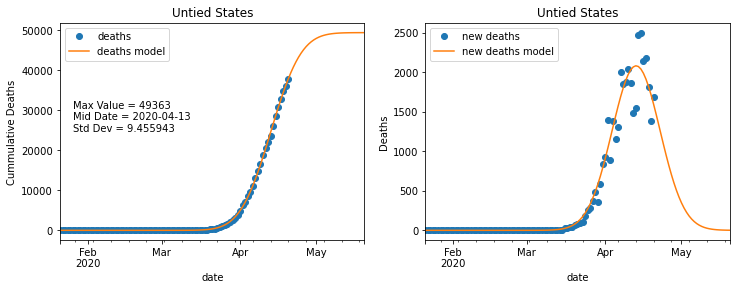

In [26]:
us = states.groupby('date').sum().reset_index()

plot_fit(us, 'Untied States')

### Fit and plot the State Deaths

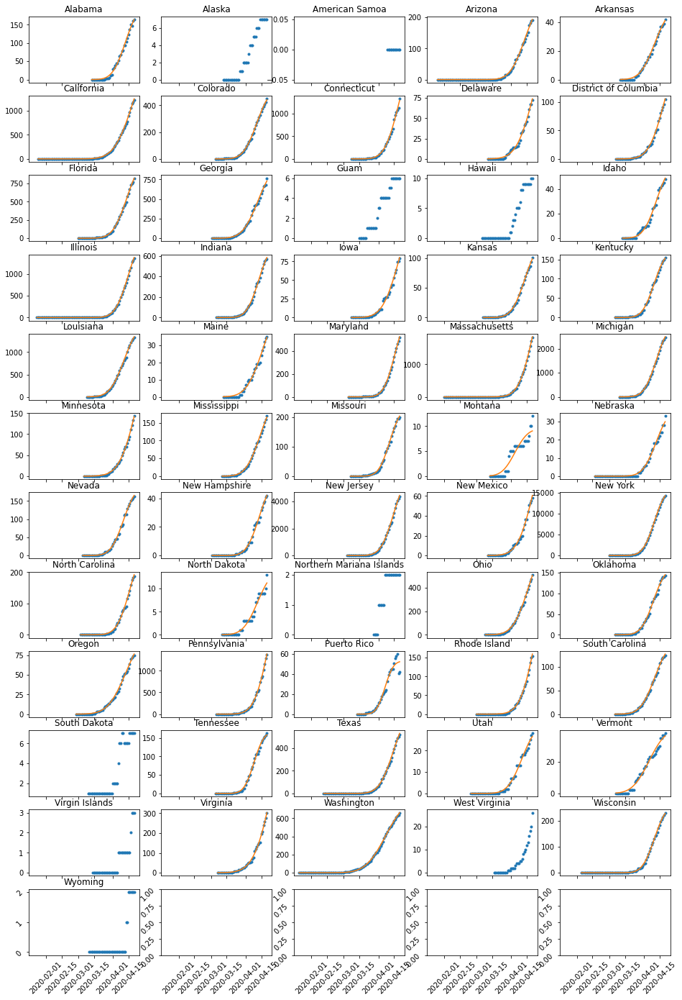

In [7]:
n_states = len(states['state'].unique()) 
ncols = 5
nrows = n_states // ncols + int(n_states % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(16, 2*nrows))

fit_parms = []
erf_defaults = [1000, mdates.date2num(datetime.date(2020,4,10)), 6]

for i, (name, gp) in enumerate(states.groupby('state')):
    row = i // 5
    col = i % 5
    
    ix = gp['deaths'] >= 0
    x = mdates.date2num(gp.loc[ix, 'date'])
    y = gp.loc[ix, 'deaths'].values

    axes[row][col].plot(gp['date'], gp['deaths'], '.')
    axes[row][col].set_title(name)

    if gp['deaths'].max() > 10:
        try:
            (popt, pcov) = curve_fit(my_erf, x, y, p0=erf_defaults)
            fit_parms.append([name, popt[0], mdates.num2date(popt[1]), popt[2]])

            axes[row][col].plot(gp['date'], my_erf(x, *popt))

        except:
            pass

for col in range(ncols):
    axes[nrows-1][col].tick_params(labelrotation=45)


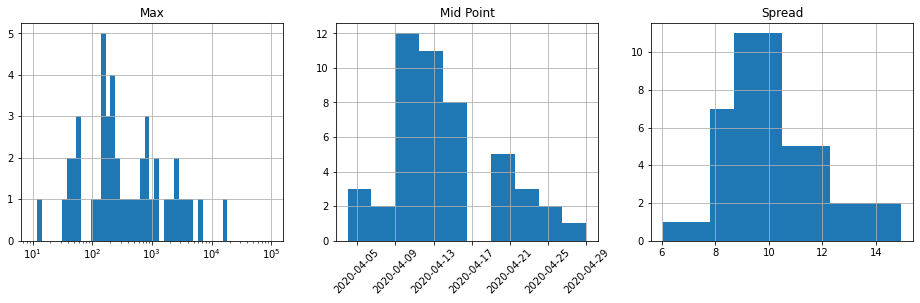

In [8]:
fit = pd.DataFrame(fit_parms, columns=['state', 'fit_max', 'fit_mid_date', 'fit_std'])
fit['fit_mid_date'] = fit['fit_mid_date'].dt.date
fit = fit[~(fit['state'] == 'South Dakota')]

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))

bins = np.logspace(1, 5)
fit['fit_max'].hist(bins=bins, ax=axes[0])
axes[0].set_title('Max')
axes[0].set_xscale('log')

fit['fit_mid_date'].hist(ax=axes[1])
axes[1].set_title('Mid Point')
plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45)

fit['fit_std'].hist(ax=axes[2])
_ = axes[2].set_title('Spread')

## Import and analyze world country data

In [9]:
gdf_raw = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv',)
gdf = gdf_raw.set_index(['Province/State', 'Country/Region', 'Lat', 'Long']).stack().reset_index()
gdf = gdf.rename({'level_4' : 'Date', 0 : 'Deaths'}, axis='columns')
gdf['Date'] = pd.to_datetime(gdf['Date'])

In [10]:
countries = gdf.groupby(['Date', 'Country/Region']).sum().reset_index()
countries = countries.groupby('Country/Region').filter(lambda x: x['Deaths'].max() > 10)

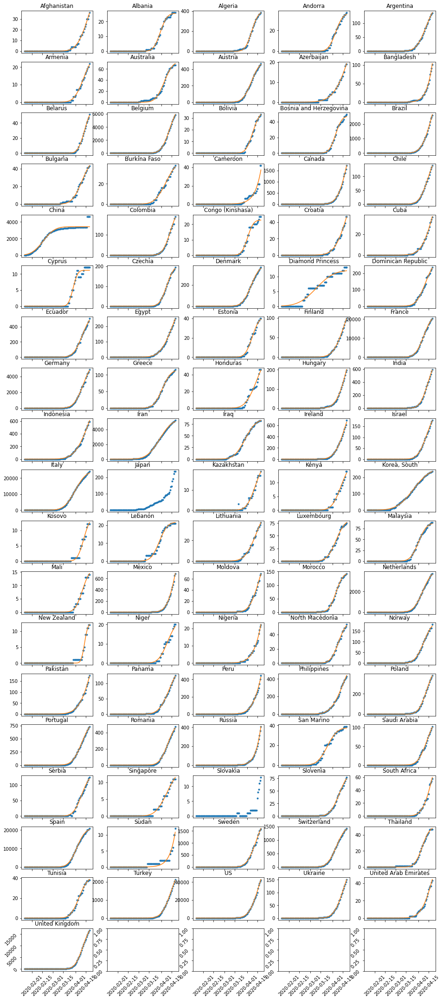

In [11]:
n_countries = len(countries['Country/Region'].unique())
ncols = 5
nrows = n_countries // ncols + int(n_countries % ncols > 0)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, sharex=True, figsize=(16, 2*nrows))

fit_parms = []
erf_defaults = [1000, mdates.date2num(datetime.date(2020,4,10)), 6]

for i, (name, gp) in enumerate(countries.groupby('Country/Region')):
    row = i // 5
    col = i % 5
    
    ix = gp['Deaths'] >= 0
    x = mdates.date2num(gp.loc[ix, 'Date'])
    y = gp.loc[ix, 'Deaths'].values

    axes[row][col].plot(gp['Date'], gp['Deaths'], '.')
    axes[row][col].set_title(name)

    if gp['Deaths'].max() > 10:
        try:
            (popt, pcov) = curve_fit(my_erf, x, y, p0=erf_defaults)
            fit_parms.append([name, popt[0], mdates.num2date(popt[1]), popt[2]])

            axes[row][col].plot(gp['Date'], my_erf(x, *popt))

        except:
            pass

for col in range(ncols):
    axes[nrows-1][col].tick_params(labelrotation=45)


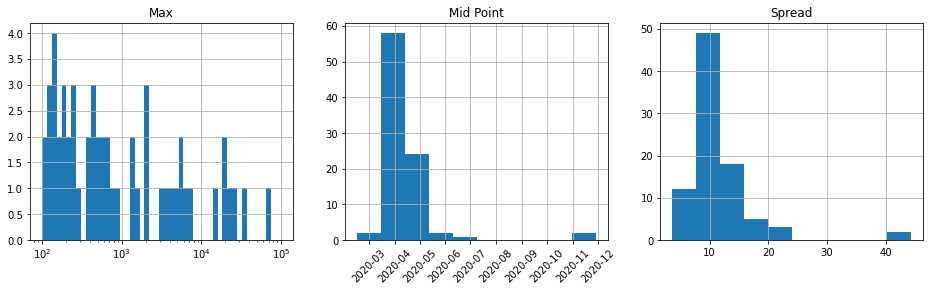

In [12]:
gfit = pd.DataFrame(fit_parms, columns=['country', 'fit_max', 'fit_mid_date', 'fit_std'])
gfit['fit_mid_date'] = gfit['fit_mid_date'].dt.date

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))

bins = np.logspace(2, 5)
gfit['fit_max'].hist(bins=bins, ax=axes[0])
axes[0].set_title('Max')
axes[0].set_xscale('log')

gfit['fit_mid_date'].hist(ax=axes[1])
axes[1].set_title('Mid Point')
plt.setp(axes[1].xaxis.get_majorticklabels(), rotation=45)

gfit['fit_std'].hist(ax=axes[2])
_ = axes[2].set_title('Spread')

## Massachusetts Miscellaneous

In [15]:
# grab census data
census = pd.read_csv('http://www2.census.gov/programs-surveys/popest/datasets/2010-2019/national/totals/nst-est2019-alldata.csv')
cols = ['NAME', 'POPESTIMATE2019']
census = census[census['SUMLEV'] == 40][cols]
census.columns = ['state', 'pop2019est']
census['pop2019est'] = census['pop2019est'].astype('Int64')

In [16]:
# join pop data to states
states = states.set_index('state').join(census.set_index('state')).reset_index()
states['new cases per mil'] = states['new cases']*1e6/states['pop2019est']
states['new deaths per mil'] = states['new deaths']*1e6/states['pop2019est']
states['cases per mil'] = states['cases']*1e6/states['pop2019est']
states['deaths per mil'] = states['deaths']*1e6/states['pop2019est']

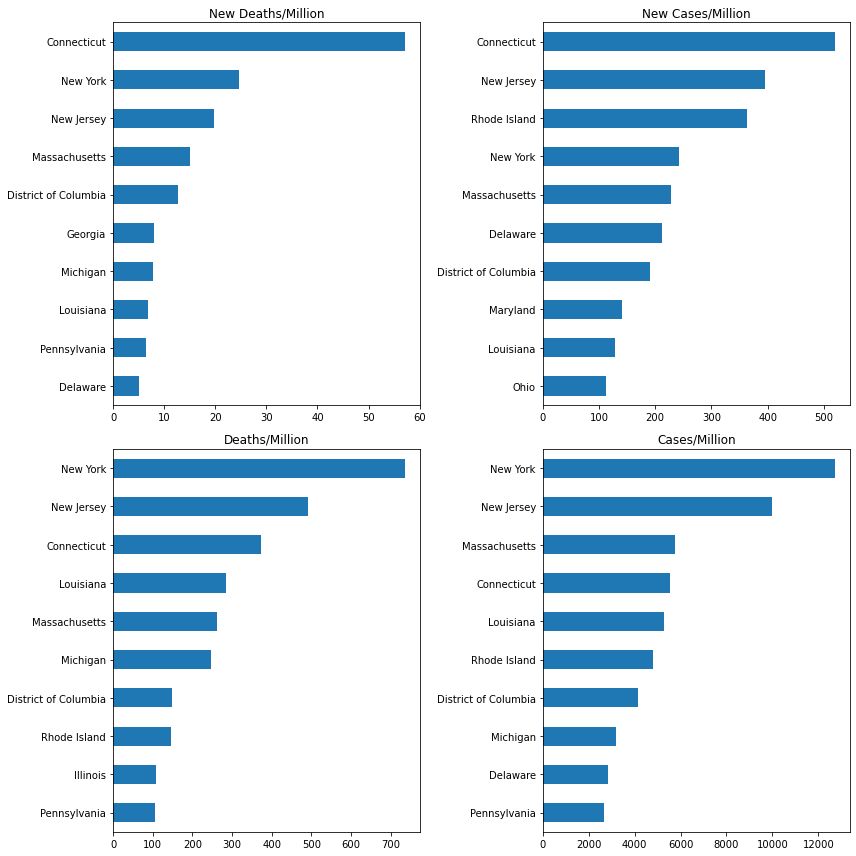

In [17]:
states_today = states[states.groupby('state')['date'].transform(max) == states['date']]
states_today = states_today[~states_today['pop2019est'].isna()]

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(12, 12))

states_today.nlargest(10, 'new deaths per mil').plot(kind='barh', x='state', y='new deaths per mil', ax=axes[0][0])
axes[0][0].invert_yaxis()
axes[0][0].legend().remove()
axes[0][0].set_title('New Deaths/Million')
axes[0][0].set_ylabel('')

states_today.nlargest(10, 'new cases per mil').plot(kind='barh', x='state', y='new cases per mil', ax=axes[0][1])
axes[0][1].invert_yaxis()
axes[0][1].legend().remove()
axes[0][1].set_title('New Cases/Million')
axes[0][1].set_ylabel('')

states_today.nlargest(10, 'deaths per mil').plot(kind='barh', x='state', y='deaths per mil', ax=axes[1][0])
axes[1][0].invert_yaxis()
axes[1][0].legend().remove()
axes[1][0].set_title('Deaths/Million')
axes[1][0].set_ylabel('')

states_today.nlargest(10, 'cases per mil').plot(kind='barh', x='state', y='cases per mil', ax=axes[1][1])
axes[1][1].invert_yaxis()
axes[1][1].legend().remove()
axes[1][1].set_title('Cases/Million')
axes[1][1].set_ylabel('')

plt.tight_layout()

(18322, 18372.0)

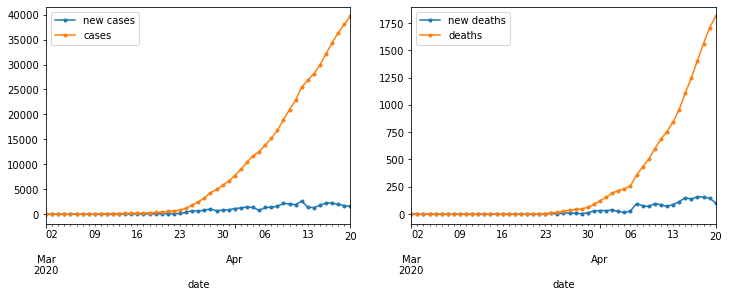

In [18]:
ma = states[states['state'] == 'Massachusetts'].copy()

fig, axes = plt.subplots(nrows=1, ncols=2, sharex=True, figsize=(12, 4))
ma.plot(x='date', y=['new cases', 'cases'], marker='.', ax=axes[0])
ma.plot(x='date', y=['new deaths', 'deaths'], marker='.', ax=axes[1])

axes[0].set_xlim(left=datetime.date(2020, 3, 1), right=None)

In [19]:
df_county = pd.read_csv('https://raw.githubusercontent.com/nytimes/covid-19-data/master/us-counties.csv',
                 parse_dates=['date'])
df_county['fips'] = df_county['fips'].astype('Int64')

ma_county = df_county[df_county['state'] == 'Massachusetts'].copy()
ma_county[['new cases', 'new deaths']] = ma_county.groupby('county')['cases', 'deaths'].diff().astype('Int64')
ma_county = ma_county[ma_county.groupby('county')['date'].transform(max) == ma_county['date']]
ma_county = ma_county.sort_values(by='deaths', ascending=True)

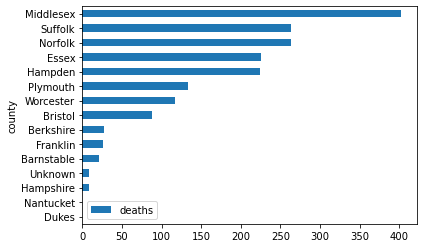

In [20]:
ma_county.plot(kind='barh', x='county', y='deaths')

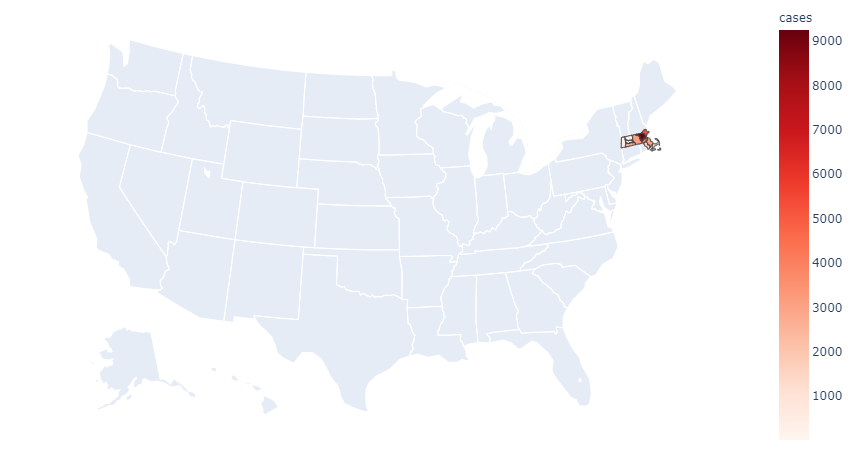

In [21]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

ma_county['fips'] = ma_county['fips'].astype('str')

import plotly.express as px

fig = px.choropleth(ma_county, geojson=counties, locations='fips', color='cases',
                    color_continuous_scale="Reds",
                    scope="usa",
                    labels={'cases' : 'cases'}
                   )
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [22]:
ma_county

,date,county,state,fips,cases,deaths,new cases,new deaths
74101,2020-04-20,Dukes,Massachusetts,25007,14,0,0,0
74107,2020-04-20,Nantucket,Massachusetts,25019,9,0,0,0
74105,2020-04-20,Hampshire,Massachusetts,25015,332,9,15,3
74111,2020-04-20,Unknown,Massachusetts,nan,855,9,40,-32
74098,2020-04-20,Barnstable,Massachusetts,25001,664,21,32,0
74103,2020-04-20,Franklin,Massachusetts,25011,187,26,6,0
74099,2020-04-20,Berkshire,Massachusetts,25003,387,28,0,-1
74100,2020-04-20,Bristol,Massachusetts,25005,1779,88,48,1
74112,2020-04-20,Worcester,Massachusetts,25027,3179,117,110,-23
74109,2020-04-20,Plymouth,Massachusetts,25023,2976,134,144,-3


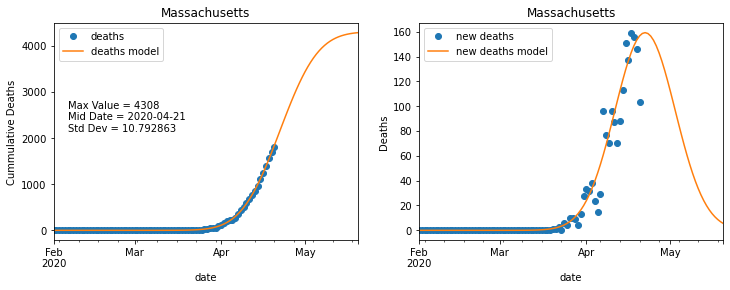

In [23]:
st = 'Massachusetts'
one_state = states[states['state'] == st]

plot_fit(one_state, st)

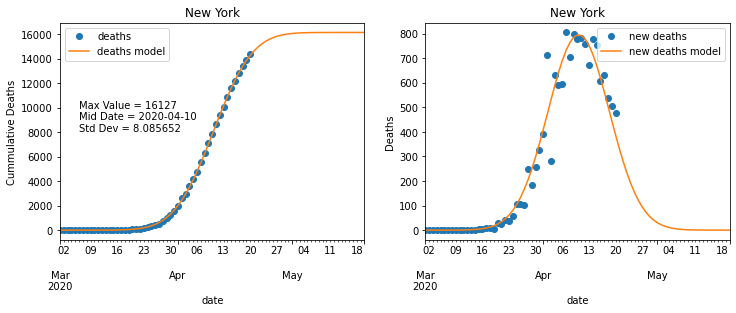

In [27]:
st = 'New York'
one_state = states[states['state'] == st]

plot_fit(one_state, st)